In [1]:
#Basic libraries
import warnings
import tensorflow as ts
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shap
from collections import Counter
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
from imblearn.over_sampling import RandomOverSampler

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score, precision_score,recall_score,f1_score

In [3]:
# Load the diabetes dataset
dataset= pd.read_csv('D:/PhD/Data Science/final_dataset.csv', sep = ',', index_col = 'id')

In [4]:
# Assume that 'Diabetes_012' is the target variable
X = dataset.drop('diabetes', axis=1)
y = dataset['diabetes']

In [5]:
from sklearn.model_selection import StratifiedShuffleSplit
# Initialize the StratifiedShuffleSplit
stratified_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
# Iterate over the splits
for train_index, test_index in stratified_splitter.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [6]:
from xgboost import XGBClassifier

In [7]:
# Train an XGBoost classifier
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [8]:
# Evaluate the model on the original test set
original_accuracy = accuracy_score(y_test, xgb_model.predict(X_test))
print("Original Accuracy:", original_accuracy)

Original Accuracy: 0.8320054432519041


In [9]:
# Scenario 1: Leave-One-Column-Out (LOCO)

In [10]:
loco_accuracy = {}
for feature in X.columns:
    X_test_loco = X_test.copy()
    X_test_loco[feature] = np.nan
    loco_accuracy[feature] = accuracy_score(y_test, xgb_model.predict(X_test_loco))
    print(f"Accuracy with remaining features after LOCO for {feature}: {loco_accuracy[feature]}")

Accuracy with remaining features after LOCO for HighBP: 0.8297227892276289
Accuracy with remaining features after LOCO for HighChol: 0.8282302846732952
Accuracy with remaining features after LOCO for CholCheck: 0.8320054432519041
Accuracy with remaining features after LOCO for BMI: 0.8207897104980136
Accuracy with remaining features after LOCO for Smoker: 0.8320273918482913
Accuracy with remaining features after LOCO for Stroke: 0.8298544808059525
Accuracy with remaining features after LOCO for HeartDiseaseorAttack: 0.8302934527336977
Accuracy with remaining features after LOCO for PhysActivity: 0.8322249292157766
Accuracy with remaining features after LOCO for Fruits: 0.832422466583262
Accuracy with remaining features after LOCO for Veggies: 0.8319395974627423
Accuracy with remaining features after LOCO for HvyAlcoholConsump: 0.8281863874805206
Accuracy with remaining features after LOCO for AnyHealthcare: 0.8319615460591295
Accuracy with remaining features after LOCO for NoDocbcCost:

In [11]:
# Display LOCO accuracies
print("\nLOCO Accuracies:")
for feature, accuracy in loco_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


LOCO Accuracies:
HighBP: Impact = 0.002282654024275188
HighChol: Impact = 0.0037751585786088837
CholCheck: Impact = 0.0
BMI: Impact = 0.011215732753890428
Smoker: Impact = -2.194859638726676e-05
Stroke: Impact = 0.0021509624459515875
HeartDiseaseorAttack: Impact = 0.0017119905182063633
PhysActivity: Impact = -0.0002194859638725566
Fruits: Impact = -0.00041702333135795744
Veggies: Impact = 6.584578916180028e-05
HvyAlcoholConsump: Impact = 0.0038190557713834172
AnyHealthcare: Impact = 4.389719277453352e-05
NoDocbcCost: Impact = 0.0037093127894470834
health_issue: Impact = -0.0001097429819363338
GenHlth: Impact = 0.051184126775092764
DiffWalk: Impact = 0.0019095278856917641
Sex: Impact = 0.0011413270121376495
Age: Impact = 0.006496784530629296
Education: Impact = -4.389719277453352e-05
Income: Impact = 0.0007462522771668478


In [12]:
# Scenario 2: Removal-Based Explanations

In [13]:
removal_accuracy = {}
for feature in X.columns:
    X_test_removed = X_test.copy()
    X_test_removed[feature] = 0
    removal_accuracy[feature] = accuracy_score(y_test, xgb_model.predict(X_test_removed))
    print(f"Accuracy with remaining features after Removal for {feature}: {removal_accuracy[feature]}")

Accuracy with remaining features after Removal for HighBP: 0.828471719233555
Accuracy with remaining features after Removal for HighChol: 0.8296130462456925
Accuracy with remaining features after Removal for CholCheck: 0.8272425978358684
Accuracy with remaining features after Removal for BMI: 0.8269353174864468
Accuracy with remaining features after Removal for Smoker: 0.8311933451855754
Accuracy with remaining features after Removal for Stroke: 0.831917648866355
Accuracy with remaining features after Removal for HeartDiseaseorAttack: 0.8313469853602862
Accuracy with remaining features after Removal for PhysActivity: 0.8313250367638989
Accuracy with remaining features after Removal for Fruits: 0.8316103685169334
Accuracy with remaining features after Removal for Veggies: 0.8323566207941002
Accuracy with remaining features after Removal for HvyAlcoholConsump: 0.8316762143060952
Accuracy with remaining features after Removal for AnyHealthcare: 0.8278352099383245
Accuracy with remaining f

In [14]:
# Display Removal-Based Explanations accuracies
print("\nRemoval-Based Explanations Accuracies:")
for feature, accuracy in removal_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


Removal-Based Explanations Accuracies:
HighBP: Impact = 0.0035337240183490604
HighChol: Impact = 0.002392397006211522
CholCheck: Impact = 0.004762845416035666
BMI: Impact = 0.0050701257654572895
Smoker: Impact = 0.0008120980663286481
Stroke: Impact = 8.779438554906704e-05
HeartDiseaseorAttack: Impact = 0.0006584578916178918
PhysActivity: Impact = 0.0006804064880051586
Fruits: Impact = 0.0003950747349706907
Veggies: Impact = -0.00035117754219615716
HvyAlcoholConsump: Impact = 0.0003292289458088904
AnyHealthcare: Impact = 0.004170233313579574
NoDocbcCost: Impact = -0.0006804064880050475
health_issue: Impact = 0.0011632756085248053
GenHlth: Impact = 0.0031605978797656364
DiffWalk: Impact = -0.0003292289458088904
Sex: Impact = 0.00019753736748540085
Age: Impact = 0.007374728386119744
Education: Impact = 0.017888106055617747
Income: Impact = 0.0006145606988433583


In [15]:
print("Accuracy Score:", round(accuracy_score(y_test, xgb_model.predict(X_test)) * 100, 2))
print("precision score:", round(precision_score(y_test, xgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("recall score:", round(recall_score(y_test, xgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("Roc curve:",roc_auc_score(y, xgb_model.predict_proba(X), multi_class='ovr').round(4)*100)
import sklearn.metrics as metrics
print("f1 score:", metrics.f1_score(y_test, xgb_model.predict(X_test), pos_label='positive', average='weighted').round(4) * 100)

Accuracy Score: 83.2
precision score: 78.36
recall score: 83.2
Roc curve: 80.69
f1 score: 79.11


In [16]:
# permutation_importance

In [17]:
from sklearn.inspection import permutation_importance
# Calculate permutation importance
perm_importance = permutation_importance(xgb_model, X_test, y_test, n_repeats=30, random_state=42)
# Get the permutation importance scores
perm_importance_scores = perm_importance.importances_mean
# Create a DataFrame to display feature names and their importance scores
perm_importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': perm_importance_scores})
# Sort the DataFrame by importance scores in descending order
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)
# Display the permutation importance results
print("\nPermutation Importance:")
print(perm_importance_df)


Permutation Importance:
                 Feature  Importance
14               GenHlth    0.007436
3                    BMI    0.006367
1               HighChol    0.003103
17                   Age    0.003085
0                 HighBP    0.003006
6   HeartDiseaseorAttack    0.000730
16                   Sex    0.000643
10     HvyAlcoholConsump    0.000502
13          health_issue    0.000390
4                 Smoker    0.000371
19                Income    0.000260
11         AnyHealthcare    0.000249
2              CholCheck    0.000178
15              DiffWalk    0.000166
5                 Stroke    0.000165
9                Veggies    0.000020
18             Education   -0.000002
7           PhysActivity   -0.000015
8                 Fruits   -0.000057
12           NoDocbcCost   -0.000316


In [18]:
# SHAP

In [19]:
#Shap tree explainer
shap_explainer = shap.TreeExplainer(model = xgb_model, model_output='margin')
shap_values = shap_explainer.shap_values(X_test)

In [20]:
#We will use below rows for prediction explanations using lime and shap
row = [100, 150,200, 250,300]

for row : 100  the real value is  0


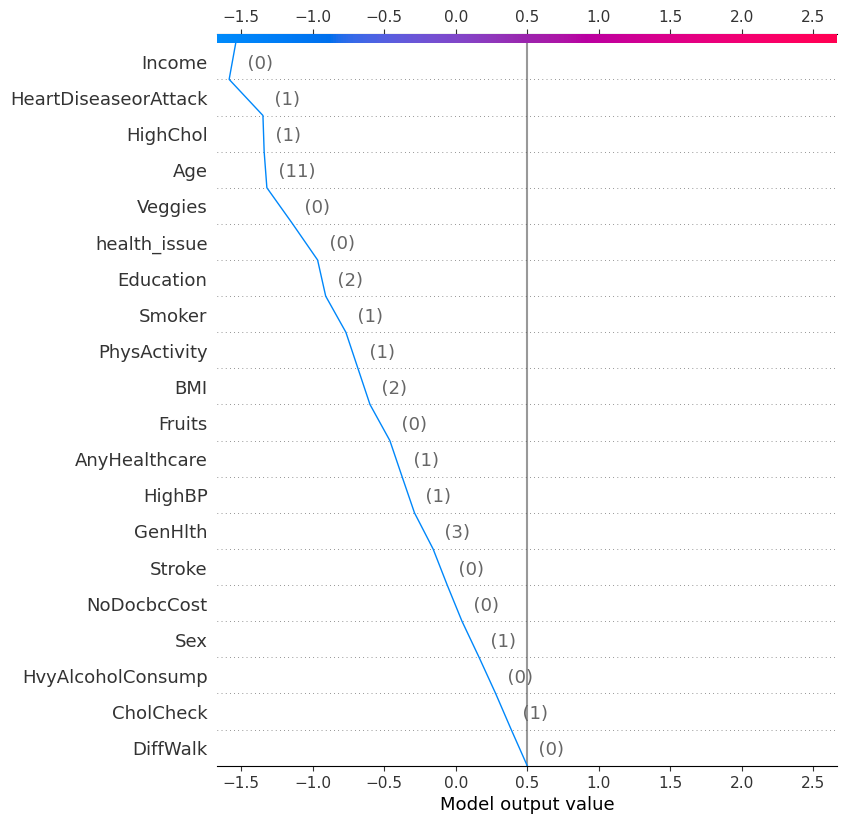

for row : 150  the real value is  0


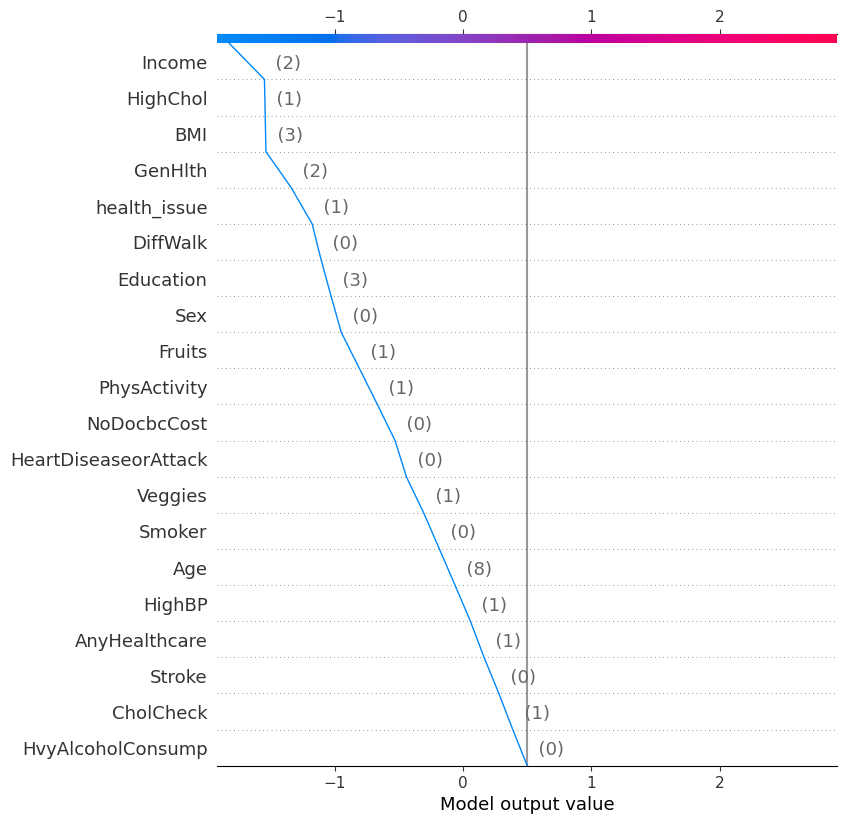

for row : 200  the real value is  0


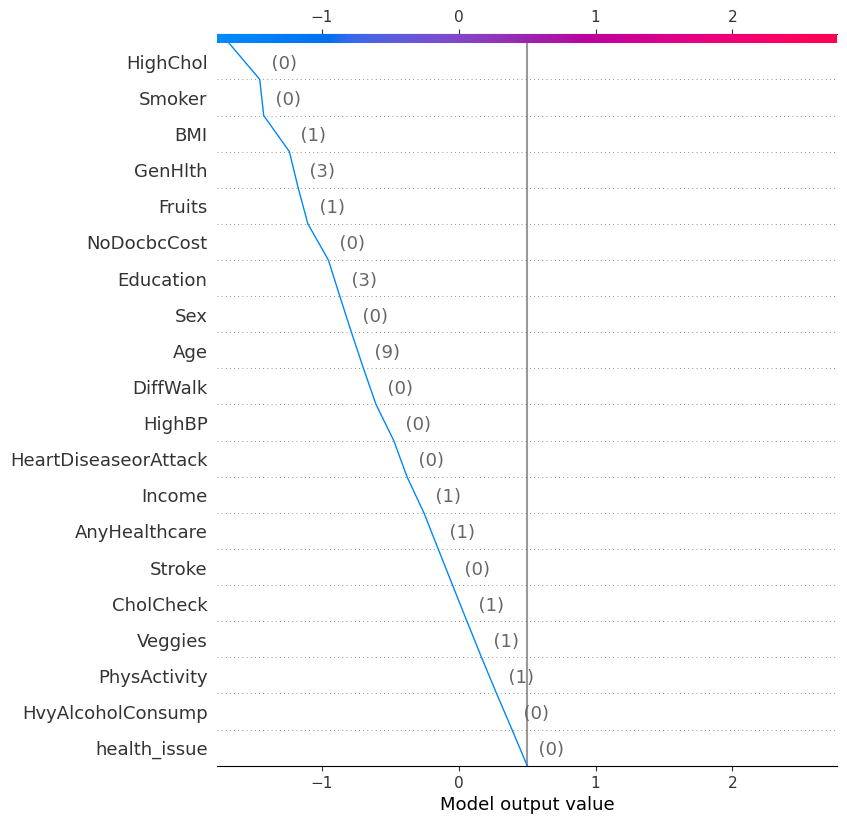

for row : 250  the real value is  0


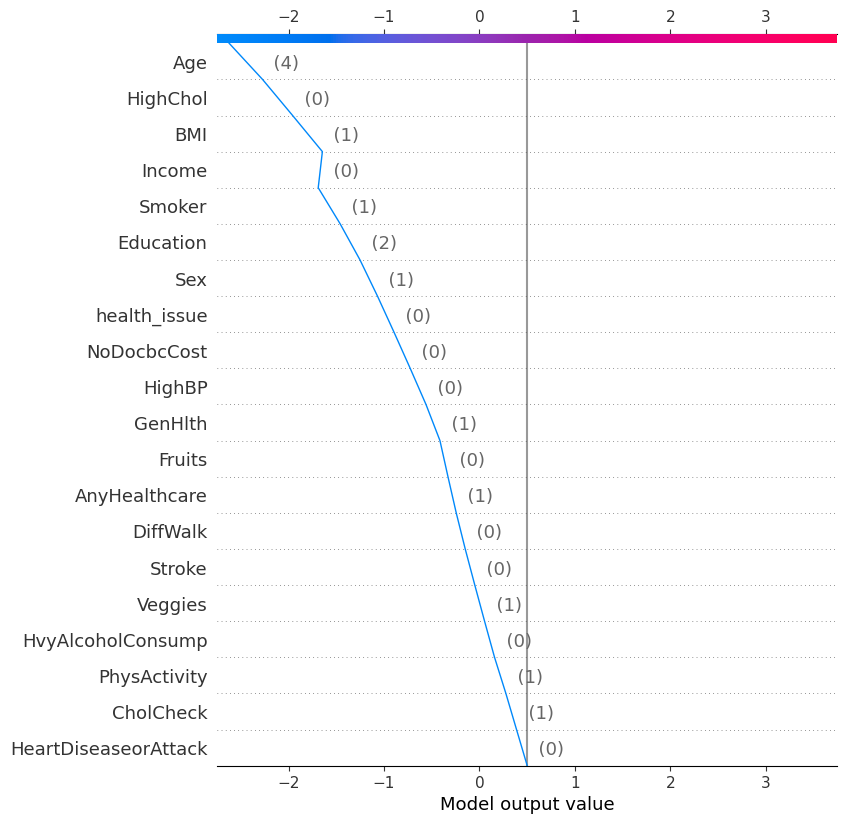

for row : 300  the real value is  2


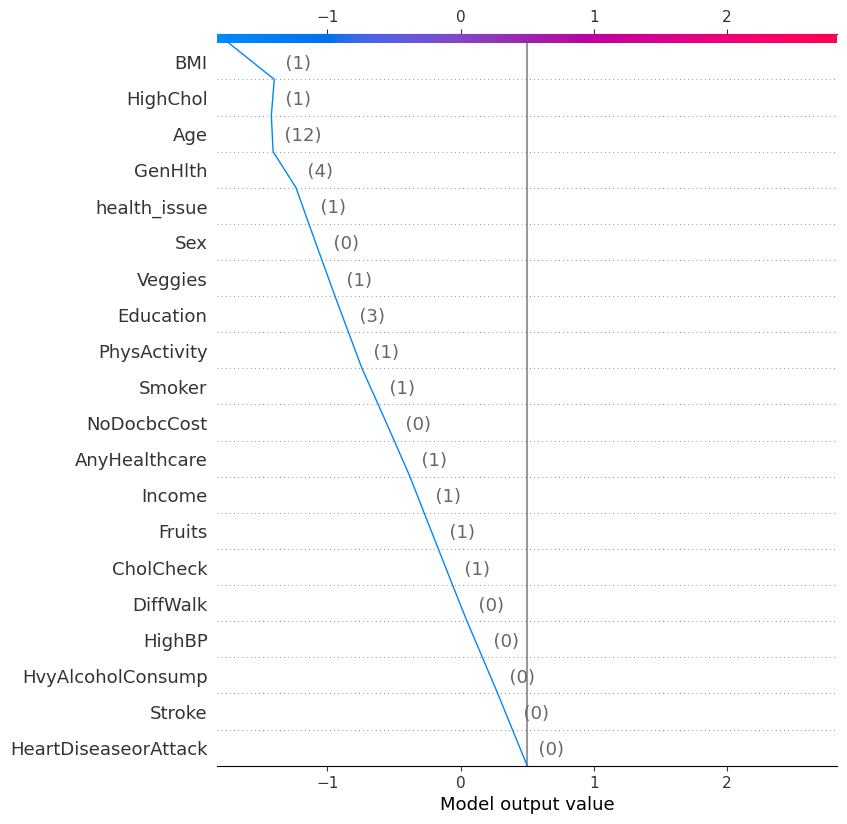

In [21]:
#Shap decision plot
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    shap.decision_plot(
    base_value=shap_explainer.expected_value[1],
    shap_values=shap_values[1][i],
    features=X_test.iloc[i],
    feature_names=X_test.columns.tolist(),
    link="identity",
    new_base_value=0.5
    )

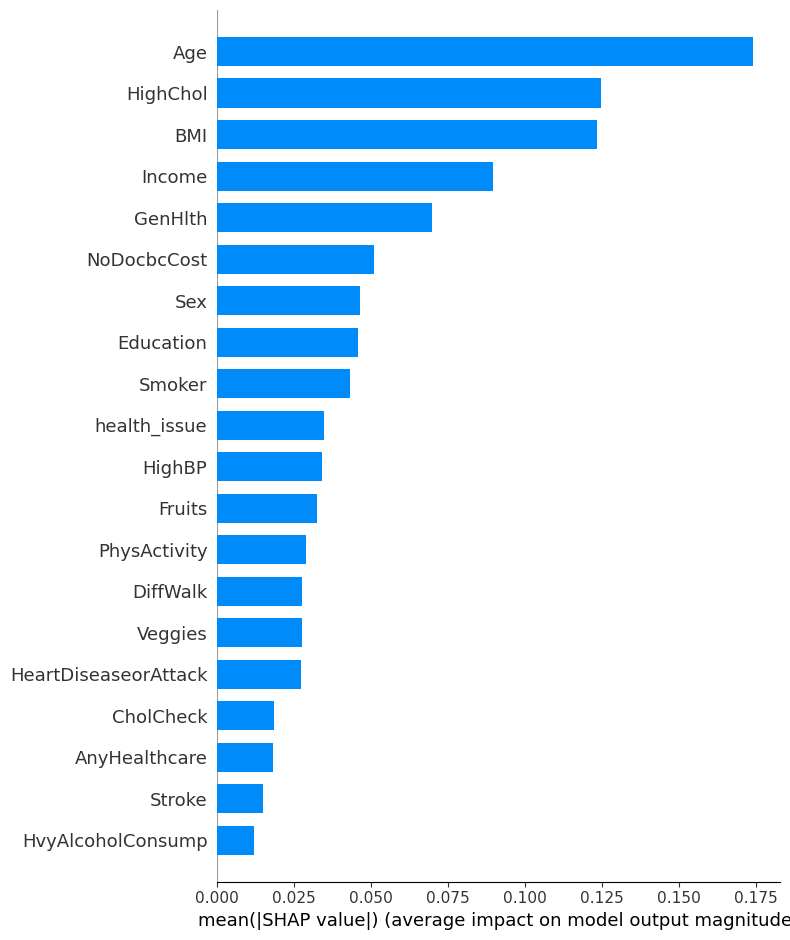

In [22]:
#bar chart
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='bar')

In [23]:
#summary plot of shap X_train
shap_values = shap_explainer.shap_values(X_train)

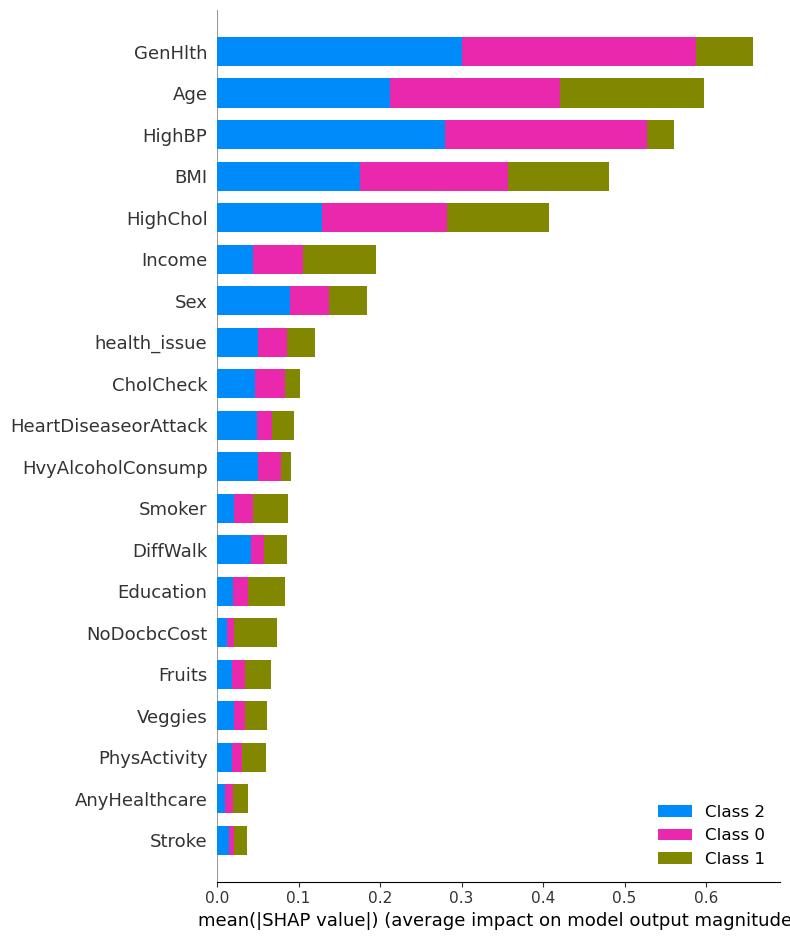

In [24]:
#shap summary plot of 
shap.summary_plot(shap_values, X_train, plot_type='bar')

In [25]:
#LIME

In [26]:
# importing Lime
import lime
import lime.lime_tabular
#using tabuar explainer of lime
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
   X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names  = ["0","1","2"],

)

In [27]:
#Explanations using lime
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i], xgb_model.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)

for row : 100  the real value is  0


for row : 150  the real value is  0


for row : 200  the real value is  0


for row : 250  the real value is  0


for row : 300  the real value is  2


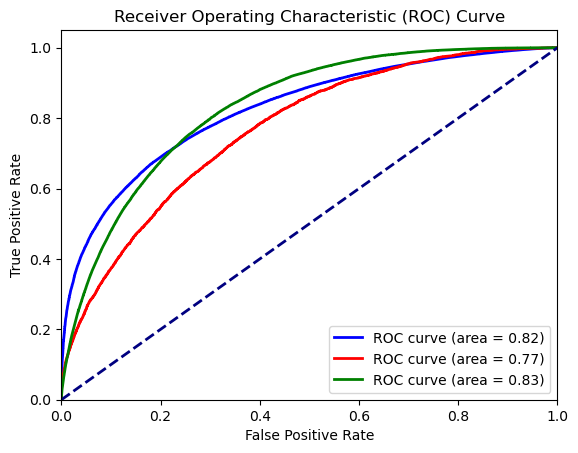

In [28]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Assuming xgb_model is your model and X, y are your data and labels
# Assuming y has three classes (0, 1, and 2)

# Binarize the labels
y_bin = label_binarize(y, classes=[0, 1, 2])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], xgb_model.predict_proba(X)[:, i])
    roc_auc[i] = roc_auc_score(y_bin[:, i], xgb_model.predict_proba(X)[:, i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve (area = %0.2f)' % roc_auc[i])

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [29]:
from imblearn.combine import SMOTETomek
Resample= SMOTETomek(sampling_strategy='not minority',random_state=10)
X_train,y_train=Resample.fit_resample(X_train,y_train)

In [30]:
# Train an XGBoost classifier
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [31]:
# Evaluate the model on the original test set
original_accuracy = accuracy_score(y_test, xgb_model.predict(X_test))
print("Original Accuracy:", original_accuracy)

Original Accuracy: 0.6948706130242971


In [32]:
# Scenario 1: Leave-One-Column-Out (LOCO)

In [33]:
loco_accuracy = {}
for feature in X.columns:
    X_test_loco = X_test.copy()
    X_test_loco[feature] = np.nan
    loco_accuracy[feature] = accuracy_score(y_test, xgb_model.predict(X_test_loco))
    print(f"Accuracy with remaining features after LOCO for {feature}: {loco_accuracy[feature]}")

Accuracy with remaining features after LOCO for HighBP: 0.6306051228023968
Accuracy with remaining features after LOCO for HighChol: 0.6508417286714515
Accuracy with remaining features after LOCO for CholCheck: 0.6924343188253111
Accuracy with remaining features after LOCO for BMI: 0.6043546015232326
Accuracy with remaining features after LOCO for Smoker: 0.7067448036698053
Accuracy with remaining features after LOCO for Stroke: 0.7724369526568776
Accuracy with remaining features after LOCO for HeartDiseaseorAttack: 0.7047474813985646
Accuracy with remaining features after LOCO for PhysActivity: 0.701169860187441
Accuracy with remaining features after LOCO for Fruits: 0.7018502666754461
Accuracy with remaining features after LOCO for Veggies: 0.6962972717894691
Accuracy with remaining features after LOCO for HvyAlcoholConsump: 0.8274401352033538
Accuracy with remaining features after LOCO for AnyHealthcare: 0.6951778933737187
Accuracy with remaining features after LOCO for NoDocbcCost:

In [34]:
# Display LOCO accuracies
print("\nLOCO Accuracies:")
for feature, accuracy in loco_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


LOCO Accuracies:
HighBP: Impact = 0.06426549022190031
HighChol: Impact = 0.044028884352845576
CholCheck: Impact = 0.0024362941989859443
BMI: Impact = 0.09051601150106448
Smoker: Impact = -0.011874190645508209
Stroke: Impact = -0.07756633963258053
HeartDiseaseorAttack: Impact = -0.009876868374267489
PhysActivity: Impact = -0.006299247163143895
Fruits: Impact = -0.006979653651149054
Veggies: Impact = -0.0014266587651720064
HvyAlcoholConsump: Impact = -0.1325695221790567
AnyHealthcare: Impact = -0.00030728034942162363
NoDocbcCost: Impact = -0.08976975922389763
health_issue: Impact = -0.02172911042338843
GenHlth: Impact = 0.1215293781962643
DiffWalk: Impact = -0.020170760079892935
Sex: Impact = 0.01848071815807384
Age: Impact = 0.04025372577423669
Education: Impact = -0.007528368560830501
Income: Impact = -0.05539825728144687


In [35]:
# Scenario 2: Removal-Based Explanations

In [36]:
removal_accuracy = {}
for feature in X.columns:
    X_test_removed = X_test.copy()
    X_test_removed[feature] = 0
    removal_accuracy[feature] = accuracy_score(y_test, xgb_model.predict(X_test_removed))
    print(f"Accuracy with remaining features after Removal for {feature}: {removal_accuracy[feature]}")

Accuracy with remaining features after Removal for HighBP: 0.747920370492307
Accuracy with remaining features after Removal for HighChol: 0.7241061434121288
Accuracy with remaining features after Removal for CholCheck: 0.8014968942736111
Accuracy with remaining features after Removal for BMI: 0.8028357586532341
Accuracy with remaining features after Removal for Smoker: 0.6813941748425189
Accuracy with remaining features after Removal for Stroke: 0.6916002721625952
Accuracy with remaining features after Removal for HeartDiseaseorAttack: 0.6954851737231404
Accuracy with remaining features after Removal for PhysActivity: 0.6828866793968525
Accuracy with remaining features after Removal for Fruits: 0.6813722262461316
Accuracy with remaining features after Removal for Veggies: 0.6898004872588398
Accuracy with remaining features after Removal for HvyAlcoholConsump: 0.684181646583701
Accuracy with remaining features after Removal for AnyHealthcare: 0.7002041219464016
Accuracy with remaining f

In [37]:
# Display Removal-Based Explanations accuracies
print("\nRemoval-Based Explanations Accuracies:")
for feature, accuracy in removal_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


Removal-Based Explanations Accuracies:
HighBP: Impact = -0.053049757468009884
HighChol: Impact = -0.029235530387831665
CholCheck: Impact = -0.10662628124931406
BMI: Impact = -0.107965145628937
Smoker: Impact = 0.013476438181778239
Stroke: Impact = 0.0032703408617018592
HeartDiseaseorAttack: Impact = -0.0006145606988433583
PhysActivity: Impact = 0.011983933627444543
Fruits: Impact = 0.013498386778165505
Veggies: Impact = 0.0050701257654572895
HvyAlcoholConsump: Impact = 0.010688966440596137
AnyHealthcare: Impact = -0.005333508922104491
NoDocbcCost: Impact = 0.006035864006496805
health_issue: Impact = 0.019051381664142553
GenHlth: Impact = -0.10429973003226445
DiffWalk: Impact = 0.0011413270121375385
Sex: Impact = -0.015188428699984602
Age: Impact = -0.12690678431114333
Education: Impact = -0.08373389521740082
Income: Impact = 0.05621035534777552


In [38]:
print("Accuracy Score:", round(accuracy_score(y_test, xgb_model.predict(X_test)) * 100, 2))
print("precision score:", round(precision_score(y_test, xgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("recall score:", round(recall_score(y_test, xgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("Roc curve:",roc_auc_score(y, xgb_model.predict_proba(X), multi_class='ovr').round(4)*100)
import sklearn.metrics as metrics
print("f1 score:", metrics.f1_score(y_test, xgb_model.predict(X_test), pos_label='positive', average='weighted').round(4) * 100)

Accuracy Score: 69.49
precision score: 81.38
recall score: 69.49
Roc curve: 78.95
f1 score: 72.68


In [39]:
# permutation_importance

In [40]:
from sklearn.inspection import permutation_importance
# Calculate permutation importance
perm_importance = permutation_importance(xgb_model, X_test, y_test, n_repeats=30, random_state=42)
# Get the permutation importance scores
perm_importance_scores = perm_importance.importances_mean
# Create a DataFrame to display feature names and their importance scores
perm_importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': perm_importance_scores})
# Sort the DataFrame by importance scores in descending order
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)
# Display the permutation importance results
print("\nPermutation Importance:")
print(perm_importance_df)


Permutation Importance:
                 Feature  Importance
14               GenHlth    0.018868
3                    BMI    0.008641
17                   Age    0.004901
1               HighChol    0.002667
10     HvyAlcoholConsump    0.002007
4                 Smoker    0.001881
8                 Fruits    0.001076
0                 HighBP    0.000199
9                Veggies   -0.000102
16                   Sex   -0.000265
5                 Stroke   -0.000278
11         AnyHealthcare   -0.000612
2              CholCheck   -0.001145
7           PhysActivity   -0.001520
6   HeartDiseaseorAttack   -0.001685
12           NoDocbcCost   -0.002692
15              DiffWalk   -0.002938
13          health_issue   -0.003403
18             Education   -0.003626
19                Income   -0.004784


# SHAP

In [41]:
#Shap tree explainer
shap_explainer = shap.TreeExplainer(model = xgb_model, model_output='margin')
shap_values = shap_explainer.shap_values(X_test)

for row : 100  the real value is  0


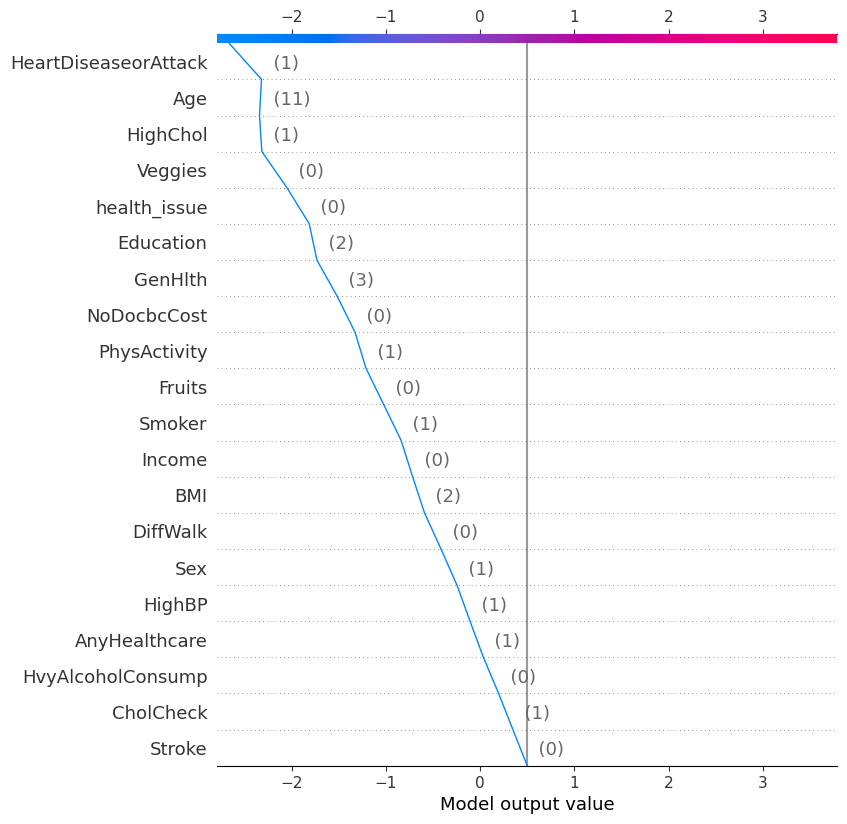

for row : 150  the real value is  0


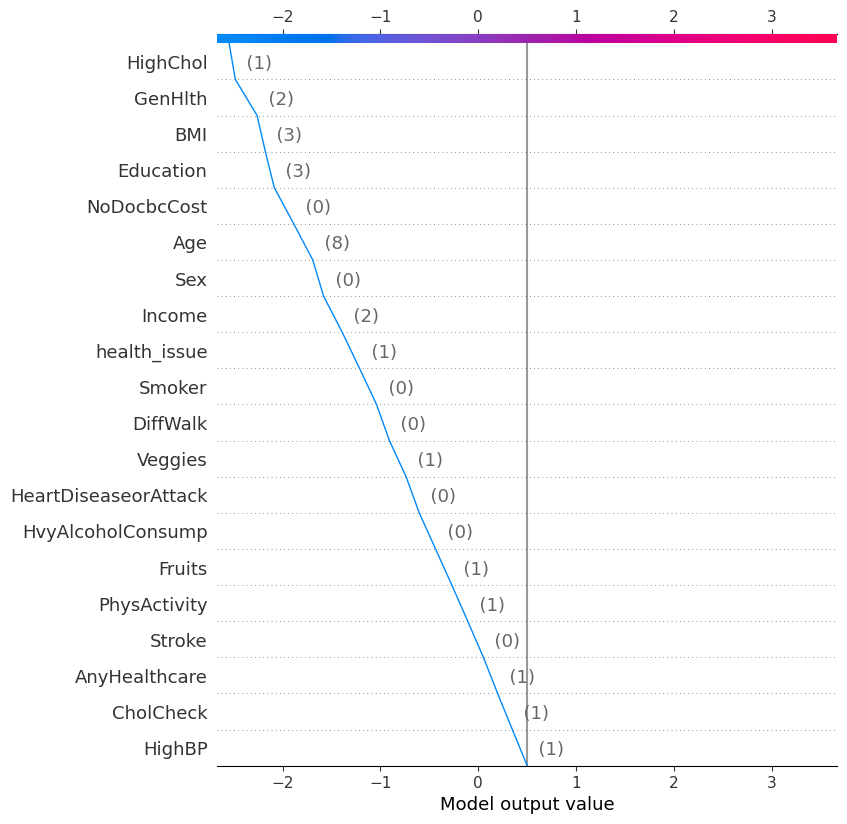

for row : 200  the real value is  0


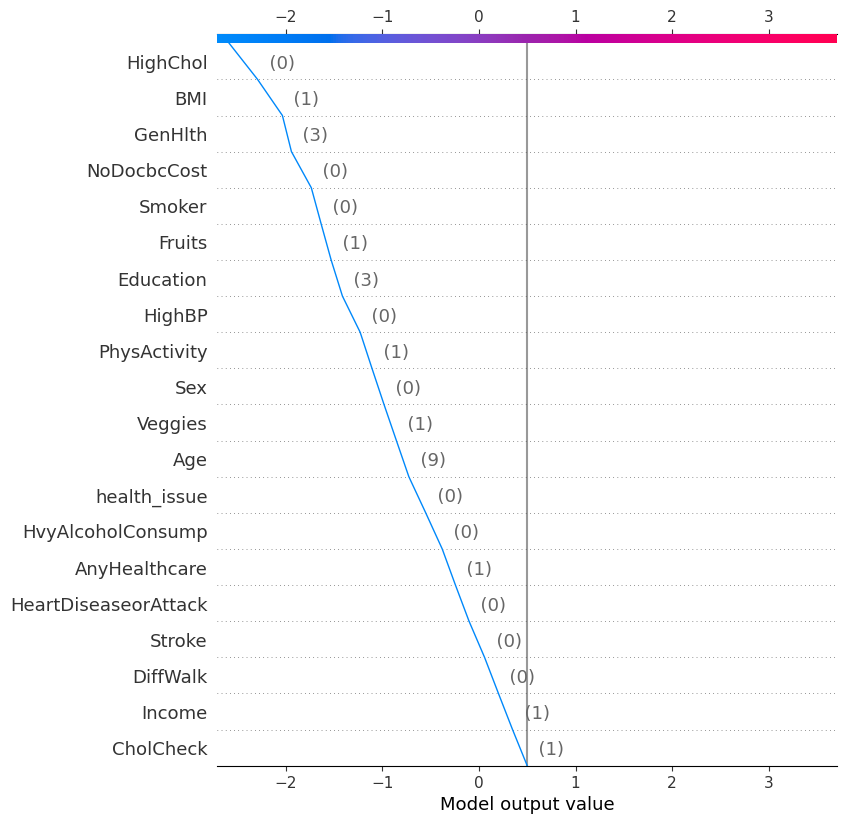

for row : 250  the real value is  0


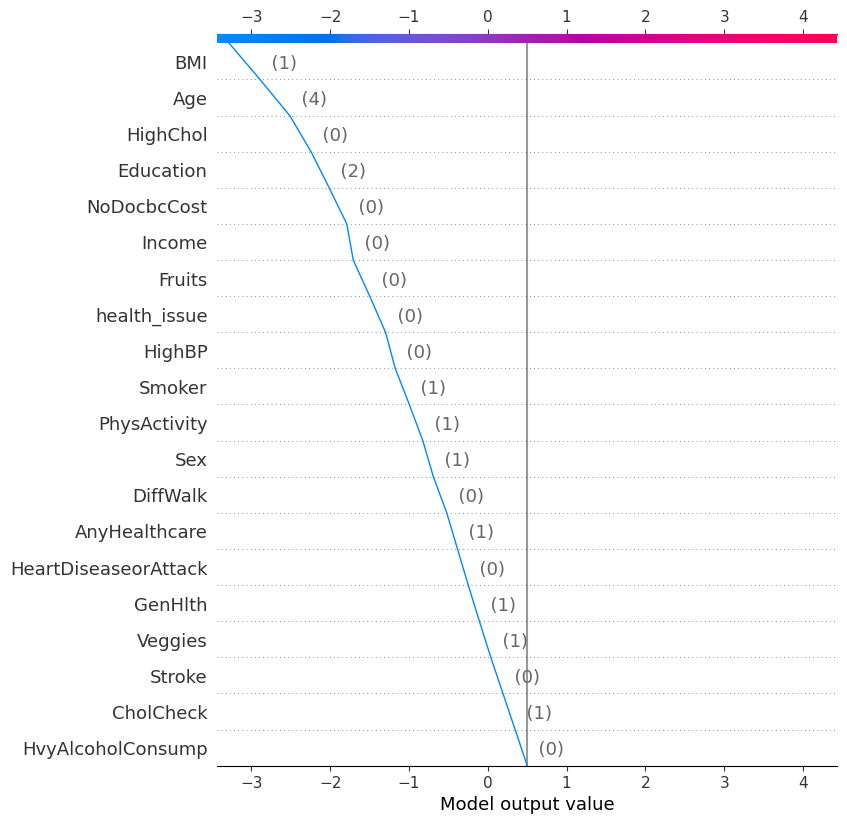

for row : 300  the real value is  2


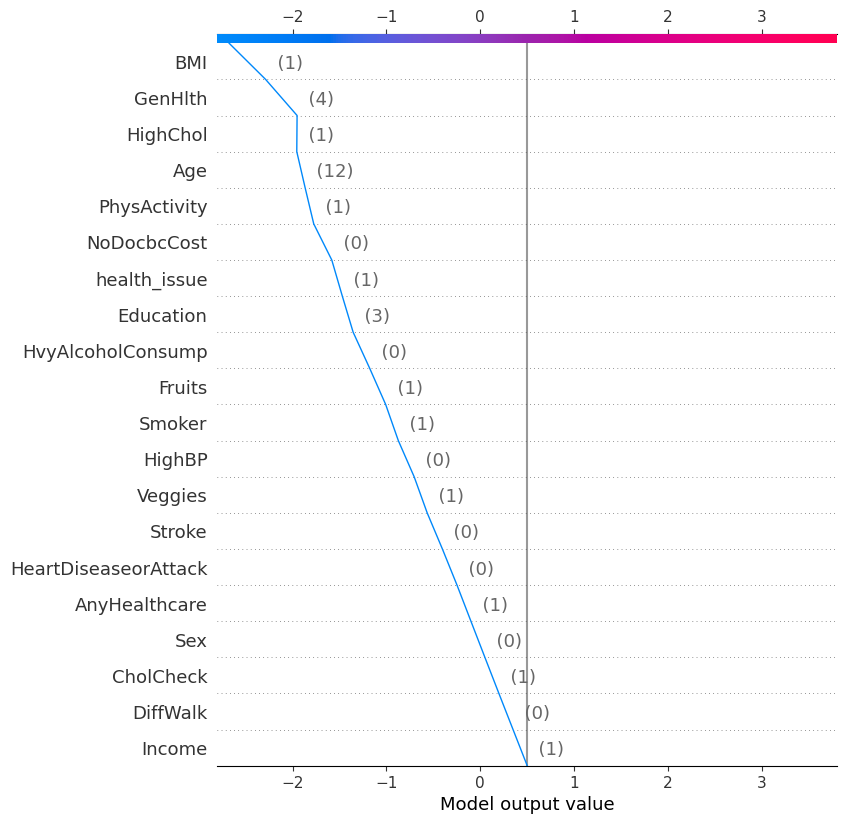

In [42]:
#Shap decision plot
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    shap.decision_plot(
    base_value=shap_explainer.expected_value[1],
    shap_values=shap_values[1][i],
    features=X_test.iloc[i],
    feature_names=X_test.columns.tolist(),
    link="identity",
    new_base_value=0.5
    )

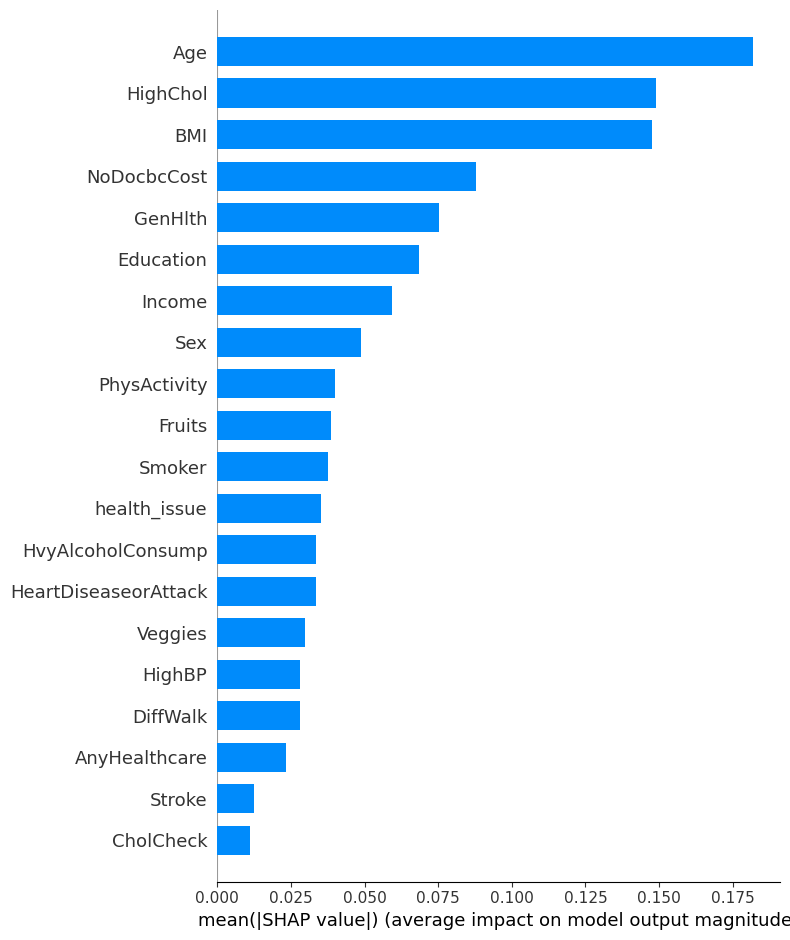

In [43]:
#bar chart
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='bar')

In [44]:
#summary plot of shap X_train
shap_values = shap_explainer.shap_values(X_train)

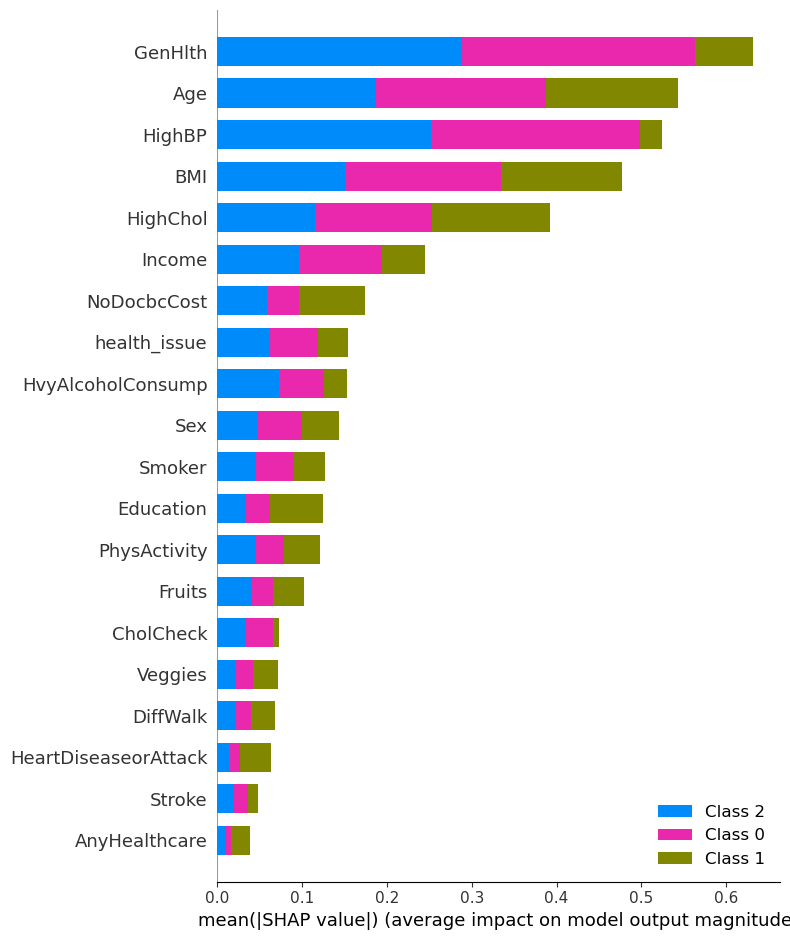

In [45]:
#shap summary plot of 
shap.summary_plot(shap_values, X_train, plot_type='bar')

# LIME

In [46]:
# importing Lime
import lime
import lime.lime_tabular
#using tabuar explainer of lime
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
   X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names  = ["0","1","2"],
)

In [47]:
#Explanations using lime
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i], xgb_model.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)

for row : 100  the real value is  0


for row : 150  the real value is  0


for row : 200  the real value is  0


for row : 250  the real value is  0


for row : 300  the real value is  2


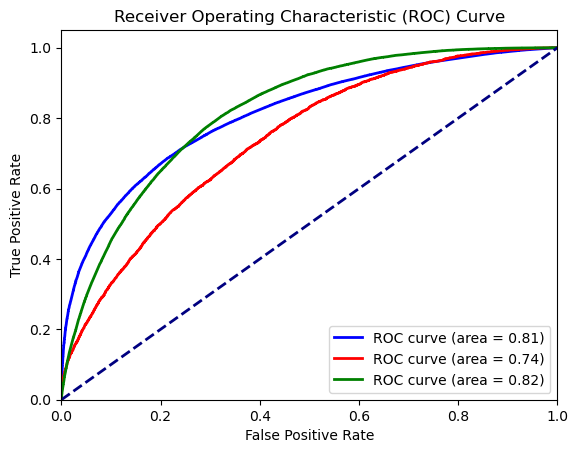

In [48]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize
# Assuming xgb_model is your model and X, y are your data and labels
# Assuming y has three classes (0, 1, and 2)
# Binarize the labels
y_bin = label_binarize(y, classes=[0, 1, 2])
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], xgb_model.predict_proba(X)[:, i])
    roc_auc[i] = roc_auc_score(y_bin[:, i], xgb_model.predict_proba(X)[:, i])
# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve (area = %0.2f)' % roc_auc[i])
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()